In [ ]:
!unzip images_styletransfer.zip

Archive:  images_styletransfer.zip
  inflating: content_img_2.jpg       
  inflating: content_marilyn.jpg     
  inflating: content_me.jpg          
 extracting: content_monnalisa.jpg   
 extracting: content_pikachu.jpg     
  inflating: content_t1.jpg          
 extracting: style_gogh.jpg          
 extracting: style_img_1.jpg         
  inflating: style_img_2.jpg         
 extracting: style_skrik.jpg         
 extracting: style_starrynight.jpg   
  inflating: content_campus.jpg      
  inflating: content_ditto.jpg       
  inflating: content_img_1.jpg       


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import copy
import matplotlib.pyplot as plt

# 장치 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 이미지 로딩 및 전처리 (수정됨)
def image_loader(image_name, imsize):
    loader = transforms.Compose([
        transforms.Resize((imsize,imsize)),
        transforms.ToTensor()])

    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

# 콘텐츠 손실 계산
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()
        self.loss = None

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

# 스타일 손실 계산
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
        self.loss = None

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

# VGG19 모델 준비
cnn = models.vgg19(pretrained=True).features.to(device).eval()

# 정규화 모듈
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
        self.std = torch.tensor(std).view(-1, 1, 1).to(device)

    def forward(self, img):
        return (img - self.mean) / self.std

# 모델 생성
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=['conv_4'],
                               style_layers=['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']):

    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = f'conv_{i}'
        elif isinstance(layer, nn.ReLU):
            name = f'relu_{i}'
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f'pool_{i}'
        elif isinstance(layer, nn.BatchNorm2d):
            name = f'bn_{i}'
        else:
            raise RuntimeError(f'Unrecognized layer: {layer.__class__.__name__}')

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module(f"content_loss_{i}", content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module(f"style_loss_{i}", style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

# 스타일 전이 실행
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1, lr=1.):
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = optim.LBFGS([input_img], lr = lr)

    print('Optimizing..')

    run = [0]
    while run[0] <= num_steps:
        def closure():
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % int(num_steps/5) == 0:
                print(f"run {run[0]}:")
                print(f'Style Loss : {style_score.item():4f} Content Loss: {content_score.item():4f}')
                print()

            return loss

        loss = closure()
        optimizer.step(closure)

    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

In [ ]:
# 메인 함수
def main(content, style, imsize, num_steps, lr):
    content_img = image_loader(content, imsize)
    style_img = image_loader(style, imsize)
    input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)

    assert style_img.size() == content_img.size(), \
        "스타일 이미지와 콘텐츠 이미지의 크기가 같아야 합니다"

    cnn = models.vgg19(pretrained=True).features.to(device).eval()

    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img, input_img, num_steps=num_steps,
                                style_weight=1e6, content_weight=1, lr=lr)

    # 결과 플로팅
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    imshow(content_img, title='Content Image')

    plt.subplot(1, 3, 2)
    imshow(style_img, title='Style Image')

    plt.subplot(1, 3, 3)
    imshow(output, title='Output Image')

    plt.tight_layout()
    plt.savefig(f"style_transfer_result_{content.split('.')[0]}_{style.split('.')[0]}.png")
    plt.show()

Building the style transfer model..
Optimizing..


<ipython-input-128-e4e89bb8f5ee>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-128-e4e89bb8f5ee>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 4.431066 Content Loss: 9.769477

run 400:
Style Loss : 0.777068 Content Loss: 6.039978

run 600:
Style Loss : 0.525819 Content Loss: 4.929317

run 800:
Style Loss : 0.450047 Content Loss: 4.510476

run 1000:
Style Loss : 0.424186 Content Loss: 4.316485



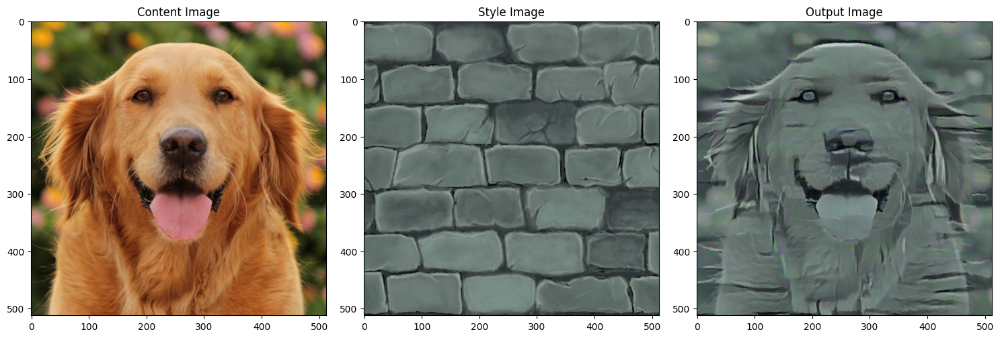

In [ ]:
content = "content_img_2.jpg"
style = "style_img_2.jpg"
imsize = 512
num_steps = 1000
lr = 0.5
main(content, style, imsize, num_steps, lr)

Building the style transfer model..
Optimizing..


<ipython-input-128-e4e89bb8f5ee>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-128-e4e89bb8f5ee>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 11.787642 Content Loss: 30.072731

run 400:
Style Loss : 6.035789 Content Loss: 21.838316

run 600:
Style Loss : 3.953511 Content Loss: 18.988869

run 800:
Style Loss : 2.590707 Content Loss: 17.890079

run 1000:
Style Loss : 1.699566 Content Loss: 17.321745



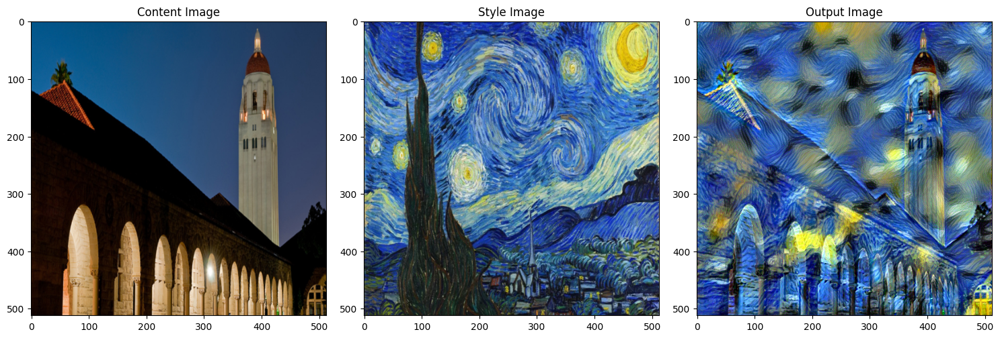

In [ ]:
content = "content_campus.jpg"
style = "style_starrynight.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

Building the style transfer model..
Optimizing..


<ipython-input-128-e4e89bb8f5ee>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-128-e4e89bb8f5ee>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 4.992434 Content Loss: 14.039692

run 400:
Style Loss : 1.310871 Content Loss: 10.092856

run 600:
Style Loss : 0.771429 Content Loss: 8.958836

run 800:
Style Loss : 0.558502 Content Loss: 8.525067

run 1000:
Style Loss : 0.497601 Content Loss: 8.306355



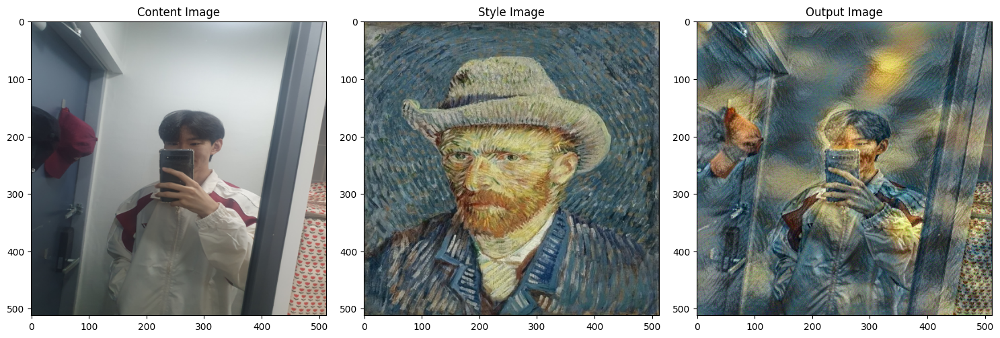

In [ ]:
content = "content_t1.jpg"
style = "style_gogh.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

Building the style transfer model..
Optimizing..


<ipython-input-136-e4e89bb8f5ee>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-136-e4e89bb8f5ee>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 5.362293 Content Loss: 8.394363

run 400:
Style Loss : 1.059007 Content Loss: 5.621846

run 600:
Style Loss : 0.646598 Content Loss: 4.805236

run 800:
Style Loss : 0.489586 Content Loss: 4.480931

run 1000:
Style Loss : 0.441257 Content Loss: 4.320623



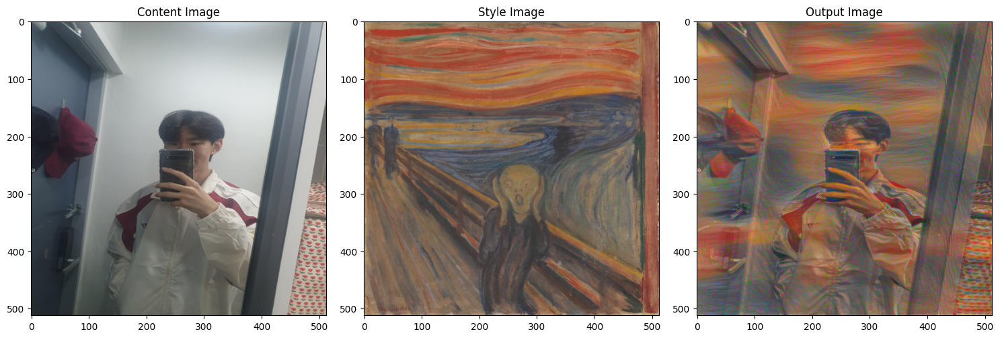

In [ ]:
content = "content_t1.jpg"
style = "style_skrik.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

# 성능 개선을 위한 코드 수정
1. 학습률 스케줄링을 적용하여 학습이 진행될수록 학습률을 줄임
    - 초기 빠른 수렴과 세밀한 튜닝 가능
2. Perceptual Loss로 콘텐츠 손실을 더 정교하게 계산
    - MSE Loss 대신 Perceptual Loss를 사용하면 신경망의 고수준 특징 맵을 사용하여 지각적 차이를 계산
3. input_img를 Content Image로 초기화하여 더 안정된 학습 과정을 보장
    - input_img를 랜덤 값 대신 Content image로 초기화하면 더 빠른 수렴과 안정된 학습 과정 가능

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import copy
import matplotlib.pyplot as plt

# 장치 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 이미지 로딩 및 전처리
def image_loader(image_name, imsize):
    loader = transforms.Compose([
        transforms.Resize((imsize, imsize)),
        transforms.ToTensor()])
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

# Perceptual Loss (지각적 손실)
class PerceptualLoss(nn.Module):
    def __init__(self, target, weight=1.0):
        super(PerceptualLoss, self).__init__()
        self.target = target.detach()
        self.weight = weight
        self.loss = None

    def forward(self, input):
        self.loss = F.l1_loss(input, self.target) * self.weight
        return input

# 스타일 손실 계산
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
        self.loss = None

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

# VGG19 모델 준비
cnn = models.vgg19(pretrained=True).features.to(device).eval()

# 정규화 모듈
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
        self.std = torch.tensor(std).view(-1, 1, 1).to(device)

    def forward(self, img):
        return (img - self.mean) / self.std

# 모델 생성
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=['conv_4'],
                               style_layers=['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']):

    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = f'conv_{i}'
        elif isinstance(layer, nn.ReLU):
            name = f'relu_{i}'
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f'pool_{i}'
            layer = nn.AvgPool2d(kernel_size=2, stride=2)
        elif isinstance(layer, nn.BatchNorm2d):
            name = f'bn_{i}'
        else:
            raise RuntimeError(f'Unrecognized layer: {layer.__class__.__name__}')

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = PerceptualLoss(target, weight=1.0)
            model.add_module(f"content_loss_{i}", content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module(f"style_loss_{i}", style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], PerceptualLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


# 스타일 전이 실행
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1, lr=1.):
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = optim.LBFGS([input_img], lr=lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.5)  # 학습률 스케줄러 추가

    print('Optimizing..')

    run = [0]
    while run[0] <= num_steps:
        def closure():
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % int(num_steps / 5) == 0:
                print(f"run {run[0]}:")
                print(f'Style Loss : {style_score.item():4f} Content Loss: {content_score.item():4f}')
                print()

            return loss

        loss = closure()
        optimizer.step(closure)
        scheduler.step()  # 학습률 감소

    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

In [ ]:
# 메인 함수
def main(content, style, imsize, num_steps, lr):
    content_img = image_loader(content, imsize)
    style_img = image_loader(style, imsize)
    input_img = content_img.clone()  # Content Image 기반 초기화

    assert style_img.size() == content_img.size(), \
        "스타일 이미지와 콘텐츠 이미지의 크기가 같아야 합니다"

    cnn = models.vgg19(pretrained=True).features.to(device).eval()

    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img, input_img, num_steps=num_steps,
                                style_weight=1e6, content_weight=1, lr=lr)

    # 결과 플로팅
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    imshow(content_img, title='Content Image')

    plt.subplot(1, 3, 2)
    imshow(style_img, title='Style Image')

    plt.subplot(1, 3, 3)
    imshow(output, title='Output Image')

    plt.tight_layout()
    plt.savefig(f"style_transfer_result_{content.split('.')[0]}_{style.split('.')[0]}.png")
    plt.show()

Building the style transfer model..
Optimizing..


<ipython-input-22-030357a7ba56>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-22-030357a7ba56>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 0.744089 Content Loss: 2.110933

run 400:
Style Loss : 0.170734 Content Loss: 1.798553

run 600:
Style Loss : 0.096658 Content Loss: 1.681983

run 800:
Style Loss : 0.073589 Content Loss: 1.631704

run 1000:
Style Loss : 0.065319 Content Loss: 1.606239



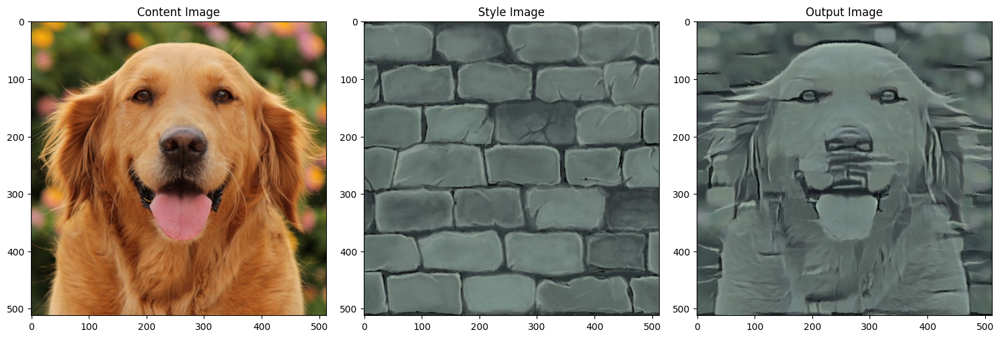

In [ ]:
content = "content_img_2.jpg"
style = "style_img_2.jpg"
imsize = 512
num_steps = 1000
lr = 0.5
main(content, style, imsize, num_steps, lr)

Building the style transfer model..
Optimizing..


<ipython-input-119-c167078d650b>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-119-c167078d650b>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 3.112979 Content Loss: 4.049480

run 400:
Style Loss : 0.425169 Content Loss: 3.837538

run 600:
Style Loss : 0.167895 Content Loss: 3.581175

run 800:
Style Loss : 0.114321 Content Loss: 3.414541

run 1000:
Style Loss : 0.096854 Content Loss: 3.300849



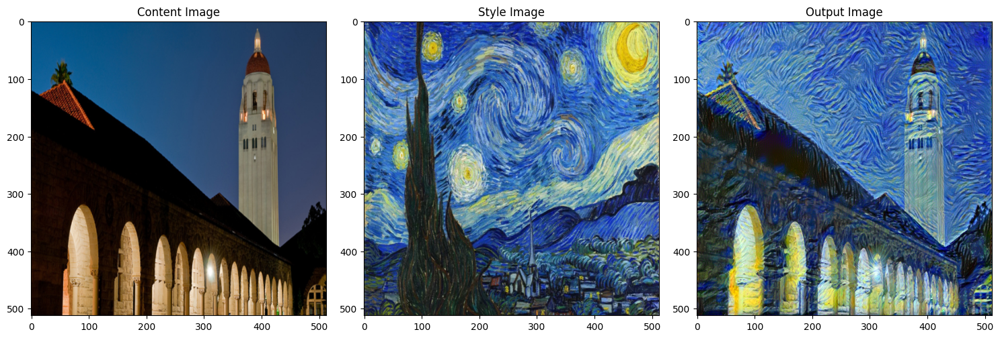

In [ ]:
content = "content_campus.jpg"
style = "style_starrynight.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

Building the style transfer model..
Optimizing..


<ipython-input-119-c167078d650b>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-119-c167078d650b>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 2.681404 Content Loss: 2.887137

run 400:
Style Loss : 0.166841 Content Loss: 2.686007

run 600:
Style Loss : 0.084542 Content Loss: 2.488842

run 800:
Style Loss : 0.073961 Content Loss: 2.371814

run 1000:
Style Loss : 0.072780 Content Loss: 2.302877



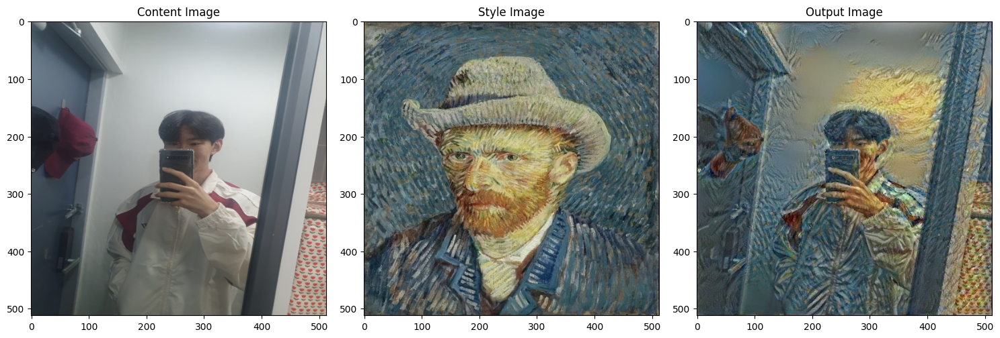

In [ ]:
content = "content_t1.jpg"
style = "style_gogh.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

Building the style transfer model..
Optimizing..


<ipython-input-133-030357a7ba56>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-133-030357a7ba56>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 3.794308 Content Loss: 2.242318

run 400:
Style Loss : 0.363386 Content Loss: 1.990508

run 600:
Style Loss : 0.115775 Content Loss: 1.762884

run 800:
Style Loss : 0.083161 Content Loss: 1.652428

run 1000:
Style Loss : 0.078618 Content Loss: 1.590385



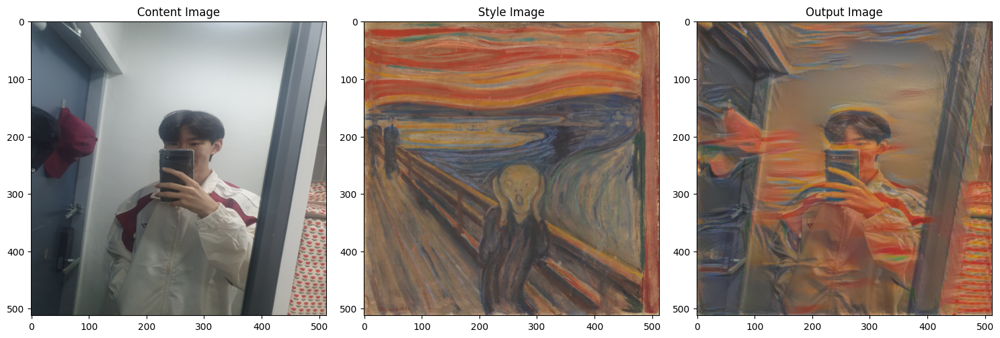

In [ ]:
content = "content_t1.jpg"
style = "style_skrik.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

# Test 1
Content Layer를 Conv_4가 아닌 다른 레이어로 바꾸어보자 (69번째 줄 참고)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import copy
import matplotlib.pyplot as plt

# 장치 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 이미지 로딩 및 전처리
def image_loader(image_name, imsize):
    loader = transforms.Compose([
        transforms.Resize((imsize, imsize)),
        transforms.ToTensor()])
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

# Perceptual Loss (지각적 손실)
class PerceptualLoss(nn.Module):
    def __init__(self, target, weight=1.0):
        super(PerceptualLoss, self).__init__()
        self.target = target.detach()
        self.weight = weight
        self.loss = None

    def forward(self, input):
        self.loss = F.l1_loss(input, self.target) * self.weight
        return input

# 스타일 손실 계산
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
        self.loss = None

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

# VGG19 모델 준비
cnn = models.vgg19(pretrained=True).features.to(device).eval()

# 정규화 모듈
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
        self.std = torch.tensor(std).view(-1, 1, 1).to(device)

    def forward(self, img):
        return (img - self.mean) / self.std

# 모델 생성
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=['conv_2'],
                               style_layers=['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']):

    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = f'conv_{i}'
        elif isinstance(layer, nn.ReLU):
            name = f'relu_{i}'
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f'pool_{i}'
            layer = nn.AvgPool2d(kernel_size=2, stride=2)
        elif isinstance(layer, nn.BatchNorm2d):
            name = f'bn_{i}'
        else:
            raise RuntimeError(f'Unrecognized layer: {layer.__class__.__name__}')

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = PerceptualLoss(target, weight=1.0)
            model.add_module(f"content_loss_{i}", content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module(f"style_loss_{i}", style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], PerceptualLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

# 스타일 전이 실행
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1, lr=1.):
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = optim.LBFGS([input_img], lr=lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.5)  # 학습률 스케줄러 추가

    print('Optimizing..')

    run = [0]
    while run[0] <= num_steps:
        def closure():
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % int(num_steps / 5) == 0:
                print(f"run {run[0]}:")
                print(f'Style Loss : {style_score.item():4f} Content Loss: {content_score.item():4f}')
                print()

            return loss

        loss = closure()
        optimizer.step(closure)
        scheduler.step()  # 학습률 감소

    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

In [ ]:
# 메인 함수
def main(content, style, imsize, num_steps, lr):
    content_img = image_loader(content, imsize)
    style_img = image_loader(style, imsize)
    input_img = content_img.clone()  # Content Image 기반 초기화

    assert style_img.size() == content_img.size(), \
        "스타일 이미지와 콘텐츠 이미지의 크기가 같아야 합니다"

    cnn = models.vgg19(pretrained=True).features.to(device).eval()

    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img, input_img, num_steps=num_steps,
                                style_weight=1e6, content_weight=1, lr=lr)

    # 결과 플로팅
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    imshow(content_img, title='Content Image')

    plt.subplot(1, 3, 2)
    imshow(style_img, title='Style Image')

    plt.subplot(1, 3, 3)
    imshow(output, title='Output Image')

    plt.tight_layout()
    plt.savefig(f"style_transfer_result_{content.split('.')[0]}_{style.split('.')[0]}.png")
    plt.show()

Building the style transfer model..
Optimizing..


<ipython-input-9-1cd04f4327be>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-9-1cd04f4327be>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 2.678456 Content Loss: 1.231758

run 400:
Style Loss : 0.113437 Content Loss: 1.230553

run 600:
Style Loss : 0.037381 Content Loss: 1.163771

run 800:
Style Loss : 0.028723 Content Loss: 1.102518

run 1000:
Style Loss : 0.024708 Content Loss: 1.061955



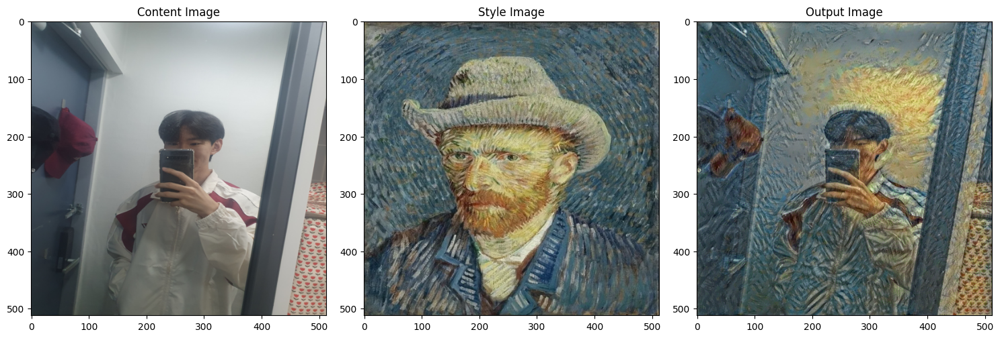

In [ ]:
content = "content_t1.jpg"
style = "style_gogh.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

## Test 1 결과 with Conv_2 (Content Layer)
- 사람의 눈으로는 크게 유의미한 차이는 보이지 않음 (조금 색상이 변하거나 질감이 변한 정도..?)
- Content Loss가 줄어듦 -> 하위 레이어가 저수준의 정보(세부 정보)를 유지하기 때문

# Test 2
weight를 조정해보자

## 기존 실행 코드

Building the style transfer model..
Optimizing..


<ipython-input-9-1cd04f4327be>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-9-1cd04f4327be>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 9.023417 Content Loss: 2.108824

run 400:
Style Loss : 2.477484 Content Loss: 2.145178

run 600:
Style Loss : 0.722345 Content Loss: 2.148096

run 800:
Style Loss : 0.213410 Content Loss: 2.138234

run 1000:
Style Loss : 0.083385 Content Loss: 2.116786



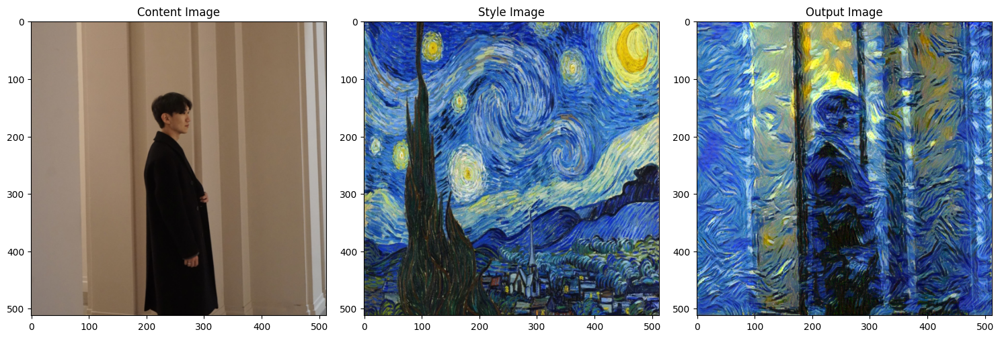

In [ ]:
content = "content_me.jpg"
style = "style_starrynight.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

## main 함수 수정
내가 사라졌어 -> Content Layer의 가중치를 높이자

In [ ]:
# 메인 함수
def main(content, style, imsize, num_steps, lr):
    content_img = image_loader(content, imsize)
    style_img = image_loader(style, imsize)
    input_img = content_img.clone()  # Content Image 기반 초기화

    assert style_img.size() == content_img.size(), \
        "스타일 이미지와 콘텐츠 이미지의 크기가 같아야 합니다"

    cnn = models.vgg19(pretrained=True).features.to(device).eval()

    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img, input_img, num_steps=num_steps,
                                style_weight=1e6, content_weight=30, lr=lr) # content_weight를 1 -> 30으로 변경

    # 결과 플로팅
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    imshow(content_img, title='Content Image')

    plt.subplot(1, 3, 2)
    imshow(style_img, title='Style Image')

    plt.subplot(1, 3, 3)
    imshow(output, title='Output Image')

    plt.tight_layout()
    plt.savefig(f"style_transfer_result_{content.split('.')[0]}_{style.split('.')[0]}.png")
    plt.show()

Building the style transfer model..
Optimizing..


<ipython-input-9-1cd04f4327be>:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1).to(device)
<ipython-input-9-1cd04f4327be>:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1).to(device)


run 200:
Style Loss : 10.170587 Content Loss: 61.161755

run 400:
Style Loss : 4.214651 Content Loss: 58.009506

run 600:
Style Loss : 2.974095 Content Loss: 55.558228

run 800:
Style Loss : 2.487926 Content Loss: 54.132557

run 1000:
Style Loss : 2.303148 Content Loss: 53.171097



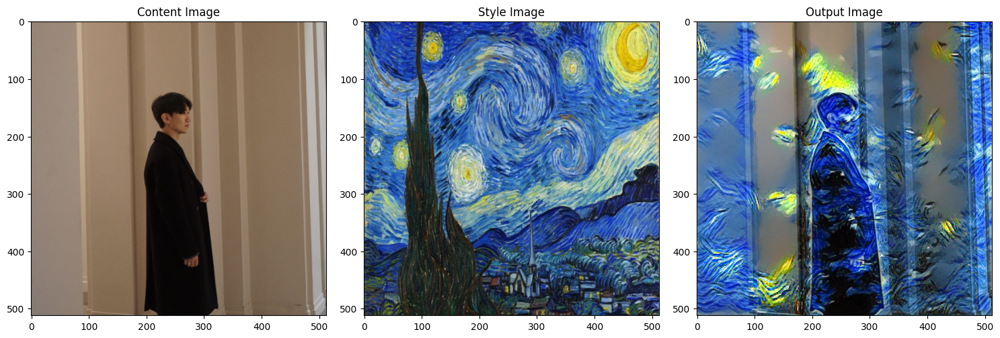

In [ ]:
content = "content_me.jpg"
style = "style_starrynight.jpg"
imsize = 512
num_steps = 1000
lr = 1.
main(content, style, imsize, num_steps, lr)

## Test2 결과
- 이제 내가 보여요
- Content Loss가 굉장히 높아짐
 - 수치적 해석: content_score *= content_weight 수식으로 인해, content_score와 함께 Loss의 스케일이 커짐
 - 모델론적 해석: 모델이 목표하는 Content Reconstruction을 충분히 달성하지 못함 (???: 아직 줄여야 할 Loss가 남아 있어..!)
    - 즉, step을 늘리면 내용을 더욱 강조하는 이미지가 생성될 것